## Unet34(ResNet)
- ResNet34のpre-trainedのものを使用
- 損失関数はMSELoss() 
- FocalLossはうまく学習していない
- Optimizer: Adam (SGDまだ試してない)
- dropoutをUNetの一番最下層(?)のところに入れてある
- 訓練データを船があるやつだけにするor船がある画像を学習する回数を増やす

### これからやりたいこと
- submissionファイルの作成

In [1]:
import cv2
from matplotlib import pyplot as plt
import numpy as np
import os
import pandas as pd
import random
import gc 

from utils import * 
from model_unet34 import * 

import torch
import torch.nn as nn
import torch.utils as utils
import torch.nn.init as init
import torch.utils.data as data
import torchvision.utils as v_utils
import torchvision.transforms as transforms
from torchvision import models 
from torch.autograd import Variable
from torch.utils.data import Dataset
import torch.nn.functional as F
import torch.utils.model_zoo as model_zoo
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load in 
from sklearn.model_selection import train_test_split

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the "../input/" directory.
# For example, running this (by clicking run or pressing Shift+Enter) will list the files in the input directory

print(os.listdir("../"))

['.gitignore', 'AirbusShipDetection-MaskRCNN', 'AirbusShipDetection-pix2pix', 'AirbusShipDetection-Unet', 'input']


In [2]:
masks = pd.read_csv('../input/train_ship_segmentations_v2.csv')
masks.head()

,ImageId,EncodedPixels
0,00003e153.jpg,NaN
1,0001124c7.jpg,NaN
2,000155de5.jpg,264661 17 265429 33 266197 33 266965 33 267733...
3,000194a2d.jpg,360486 1 361252 4 362019 5 362785 8 363552 10 ...
4,000194a2d.jpg,51834 9 52602 9 53370 9 54138 9 54906 9 55674 ...


In [3]:
masks.shape

(231723, 2)

### ここで船画像の増量を行う

In [4]:
ship_mask = masks[~masks['EncodedPixels'].isnull()]
masks = pd.concat((masks, ship_mask))  
masks = pd.concat((masks, ship_mask))
print(masks.shape)

(395169, 2)


In [5]:
in_df = pd.read_csv('../input/sample_submission_v2.csv')  
grp = list(in_df.groupby('ImageId'))
image_ids =  [_id for _id, _ in grp]   
rgb_path=os.path.join("../input/test_v2", image_ids[0])
image = cv2.imread(rgb_path)  
print(rgb_path) 
print(image.shape)

../input/test_v2\00002bd58.jpg
(768, 768, 3)


In [5]:
train_image_dir = "../input/train_v2"
test_image_dir = "../input/test_v2"
# これは1つ1つのデータを渡していくもの
class ShipDataset(Dataset):
    def __init__(self, in_df, transform=None, mode='train'):
        grp = list(in_df.groupby('ImageId')) 
        self.image_ids = [_id for _id, _ in grp] 
        
        if mode == 'train':
            self.image_masks = [m['EncodedPixels'].values for _,m in grp]
        self.transform = transform
        self.mode = mode
        self.img_transform = transforms.Compose([
        transforms.ToTensor(),
        # transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
        ])

    def __len__(self):
        return len(self.image_ids)
               
    def __getitem__(self, idx):
        img_file_name = self.image_ids[idx]
        if self.mode == 'train':
            rgb_path = os.path.join(train_image_dir, img_file_name)
            mask = masks_as_image(self.image_masks[idx])
            mask = cv2.resize(mask, (img_size,img_size))
        else:
            rgb_path = os.path.join(test_image_dir, img_file_name)
        img = cv2.imread(rgb_path)
        
        # リサイズ
        img = cv2.resize(img,(img_size,img_size))
        
        if self.transform is not None:
            img, mask = self.transform(img, mask)
        tmp = self.img_transform(img) 
    
        if self.mode == 'train':
            #return self.to_float_tensor(img), self.to_float_tensor(mask)
            #eturn img, mask
            return tmp, torch.from_numpy(np.moveaxis(mask, -1, 0)).float()
        else:
            return tmp, str(img_file_name)
    
class AirbusDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.image_paths = os.listdir(root_dir)
        self.root_dir = root_dir
        self.transform = transform

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        image_path = os.path.join(self.root_dir, self.image_paths[idx])
        image = cv2.imread(image_path)
        #image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        masked_img = create_mask(image_path)
        if self.transform:
            image = self.transform(image)
            masked_img = self.transform(masked_img)
        return image, masked_img

In [11]:
BATCH_SIZE = 40 # 次は40でもいけそう
img_size = 256 
DROP = 0.2

In [27]:
train_transform = DualCompose([
        HorizontalFlip(),
        VerticalFlip(),
        Rotate(),
        #RandomCrop((256,256,3)),
        #ImageOnly(RandomBrightness()),
        #ImageOnly(RandomContrast()),
])

In [28]:
class FocalLoss(nn.Module):
    def __init__(self, gamma):
        super().__init__()
        self.gamma = gamma
        
    def forward(self, input, target):
        if not (target.size() == input.size()):
            raise ValueError("Target size ({}) must be the same as input size ({})"
                             .format(target.size(), input.size()))

        max_val = (-input).clamp(min=0)
        loss = input - input * target + max_val + \
            ((-max_val).exp() + (-input - max_val).exp()).log()

        invprobs = F.logsigmoid(-input * (target * 2.0 - 1.0))
        loss = (invprobs * self.gamma).exp() * loss
        
        return loss.mean()

In [29]:
def dice_loss(input, target):
    input = torch.sigmoid(input)
    smooth = 1.0

    iflat = input.view(-1)
    tflat = target.view(-1)
    intersection = (iflat * tflat).sum()
    
    return ((2.0 * intersection + smooth) / (iflat.sum() + tflat.sum() + smooth))

In [30]:
class MixedLoss(nn.Module):
    def __init__(self, alpha, gamma):
        super().__init__()
        self.alpha = alpha
        self.focal = FocalLoss(gamma)
        
    def forward(self, input, target):
        loss = self.alpha*self.focal(input, target) - torch.log(dice_loss(input, target))
        return loss

In [31]:
def dice(pred, targs):
    pred = (pred>0).float()
    return 2.0 * (pred*targs).sum() / ((pred+targs).sum() + 1.0)

def IoU(pred, targs):
    pred = (pred>0).float()
    intersection = (pred*targs).sum()
    return intersection / ((pred+targs).sum() - intersection + 1.0)

In [12]:
m = make_model()

Unet34(
  (rn): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu):

In [6]:
def make_loader(in_df, batch_size, shuffle=False, transform=None, mode='train'):
    return data.DataLoader(
        dataset=ShipDataset(in_df, transform=transform, mode=mode),
        shuffle=shuffle,
        num_workers=0,
        batch_size=batch_size,
        pin_memory=torch.cuda.is_available()) 
train_df, valid_df = train_test_split(masks, test_size = 0.05)  

In [14]:
train_batch = make_loader(train_df, batch_size=BATCH_SIZE,shuffle=True,\
                           transform=train_transform)
valid_batch = make_loader(valid_df, batch_size=BATCH_SIZE//2,shuffle=False,\
                         transform=train_transform)

In [15]:
loss_func = nn.MSELoss().cuda(0) 
#loss_func = MixedLoss(10.0,2.0).cuda(0)

In [7]:
import matplotlib.colors as clr
from mpl_toolkits.axes_grid1 import make_axes_locatable
cdict3 = {'red':((0.0,1.0,1.0),
                 (0.5,0.25,0.25),
                 (1.0,1.0,1.0)),
          'green':((0.0,1.0,1.0),
                   (0.5,0.5,0.5),
                   (0.75,1.0,1.0),
                   (1.0,0.25,0.25)),
          'blue':((0.0,1.0,1.0),
                  (0.5,0.75,0.75),
                  (0.75,0.0,0.0),
                  (1.0,0.0,0.0))}
cmap = clr.LinearSegmentedColormap('cmap', cdict3)


In [22]:
def train(epoch, lr, folder, stopping=9999,model_path=None, st_epoch=0):
    if not folder in os.listdir("."):
        os.mkdir(folder) 
    
    gen_optimizer = torch.optim.Adam(m.parameters(),lr=lr)
    if st_epoch>0:
        for param in m.parameters():
            param.requires_grad = True
    if model_path:
        m.load_state_dict(torch.load(os.path.join(folder, model_path)))
    file = open('./unet_loss_0.002', 'w')
    loss_record = []
    last_valid_loss = 999999
    for i in range(st_epoch, epoch):
        if i >= 7:
            lrs = np.array([lr/100, lr/10, lr]) 
            gen_optimizer = torch.optim.Adam(m.parameters(), lr=lrs[(i-1)%3])
        if i == 1:
            for param in m.parameters():
                param.requires_grad = True
        for _, (images,img_masks) in enumerate(train_batch):
            gen_optimizer.zero_grad()

            x = Variable(images.float()).cuda(0)
            y_ = Variable(img_masks).cuda(0)
            y = m.forward(x).reshape(-1, img_size, img_size).cuda(0) 

            loss = loss_func(y,y_)
            file.write(str(loss.data[0])+"\n")
            loss_record.append(loss.data[0])
            loss.backward()
            gen_optimizer.step()


            if _ % 400 ==0:
                print("epoch : {}, time : {}, loss : {}".format(i, _, loss.data[0]))
                plt.figure()
                plt.title("original")
                for img_num in range(20):
                    plt.subplot(4,5,img_num+1)
                    plt.imshow(np.array(x.cpu().data[img_num]*256,dtype=np.uint8).transpose())
                    plt.tick_params(labelbottom='off',bottom='off')
                    plt.tick_params(labelleft='off', left='off')
                plt.savefig(folder + "/{}_{}_{}.png".format(i,_,"original"))

                plt.figure()
                plt.title('label') 
                for img_num in range(20):
                    plt.subplot(4,5,img_num+1)
                    plt.imshow(np.array(y_.cpu().data[img_num]))
                    plt.tick_params(labelbottom='off',bottom='off')
                    plt.tick_params(labelleft='off', left='off')
                plt.savefig(folder + "/{}_{}_{}.png".format(i,_,"label"))


                plt.figure()
                plt.title('generated')
                for img_num in range(20):
                    plt.subplot(4,5,img_num+1)
                    a = np.array(y.cpu().data[img_num]).reshape(256,256)
                    ax = plt.gca()
                    im = ax.imshow(a, cmap=cmap,vmin=-1,vmax=1) 

                    plt.tick_params(labelbottom='off',bottom='off')
                    plt.tick_params(labelleft='off', left='off')
                divider = make_axes_locatable(ax)
                cax = divider.append_axes("right", size="5%", pad=0.05)
                plt.colorbar(im, cax=cax)
                plt.savefig(folder + "/{}_{}_{}.png".format(i,_,"generated"))

                torch.save(m.state_dict(), folder + '/u_net_{}_{}.pkl'.format(i,_))  
                if _ != 0  and _ != 3000:
                    os.remove(last_file_path)

                last_file_path =  folder + '/u_net_{}_{}.pkl'.format(i,_)
            if _ % 800 == 0 or _==400 or _ == stopping:
                plt.figure(figsize=(7,7)) 
                plt.plot(np.convolve(loss_record, v = np.ones(100)/100.0))
                plt.xlabel("num_batch") 
                plt.ylabel("train_loss")
                plt.yscale('log')
                plt.title("Loss")
                plt.savefig(folder + "/{}_{}_{}.png".format(i,_,"loss"))
                loss_list = [] 
                for k, (images, img_masks) in enumerate(valid_batch):
                    x = Variable(images).cuda(0)
                    y_ = Variable(img_masks).cuda(0)
                    y = m.forward(x).reshape(-1, img_size, img_size)
                    loss_list.append(loss_func(y,y_).data[0]) 

                valid_loss = np.array(loss_list).mean() 
                print("Epoch :{}, Time : {} , Valid_Loss: {}".format(i, _,valid_loss))
                if _ == 400 and last_valid_loss < valid_loss and i <= 3:
                    lr /= 5
                    gen_optimizer = torch.optim.Adam(m.parameters(),lr=lr)
                    print("the learning rate turned to be  ", lr)
                if _ == 0:
                    last_valid_loss = valid_loss
            
            if _ > stopping:
                break

            del x
            del y_
            del y
            gc.collect();

- MixedLossでやった場合
　どの学習率でやっても全て-1以下に振りきれてしまい、学習がうまく進んでくれなかった。

Unet34(
  (rn): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu):

C:\Users\sunhe\AppData\Local\Programs\Python\Python36\lib\site-packages\ipykernel_launcher.py:29: UserWarning: invalid index of a 0-dim tensor. This will be an error in PyTorch 0.5. Use tensor.item() to convert a 0-dim tensor to a Python number
C:\Users\sunhe\AppData\Local\Programs\Python\Python36\lib\site-packages\ipykernel_launcher.py:30: UserWarning: invalid index of a 0-dim tensor. This will be an error in PyTorch 0.5. Use tensor.item() to convert a 0-dim tensor to a Python number
C:\Users\sunhe\AppData\Local\Programs\Python\Python36\lib\site-packages\ipykernel_launcher.py:36: UserWarning: invalid index of a 0-dim tensor. This will be an error in PyTorch 0.5. Use tensor.item() to convert a 0-dim tensor to a Python number


epoch : 5, time : 0, loss : 0.00982887577265501


C:\Users\sunhe\AppData\Local\Programs\Python\Python36\lib\site-packages\matplotlib\cbook\deprecation.py:107: MatplotlibDeprecationWarning: Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)
C:\Users\sunhe\AppData\Local\Programs\Python\Python36\lib\site-packages\ipykernel_launcher.py:89: UserWarning: invalid index of a 0-dim tensor. This will be an error in PyTorch 0.5. Use tensor.item() to convert a 0-dim tensor to a Python number


Epoch :5, Time : 0 , Valid_Loss: 0.003627522150054574
epoch : 5, time : 400, loss : 0.0012366930022835732
Epoch :5, Time : 400 , Valid_Loss: 0.003711178433150053
epoch : 5, time : 800, loss : 0.012693395838141441
Epoch :5, Time : 800 , Valid_Loss: 0.003737259889021516
epoch : 5, time : 1200, loss : 0.012737554498016834
epoch : 5, time : 1600, loss : 0.003477805759757757
Epoch :5, Time : 1600 , Valid_Loss: 0.0037978030741214752
epoch : 5, time : 2000, loss : 0.00326739763841033


C:\Users\sunhe\AppData\Local\Programs\Python\Python36\lib\site-packages\matplotlib\pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


epoch : 5, time : 2400, loss : 0.019762445241212845
Epoch :5, Time : 2400 , Valid_Loss: 0.004410171415656805
epoch : 6, time : 0, loss : 0.010911427438259125
Epoch :6, Time : 0 , Valid_Loss: 0.0041050985455513
epoch : 6, time : 400, loss : 0.01691572740674019
Epoch :6, Time : 400 , Valid_Loss: 0.003851048182696104
epoch : 6, time : 800, loss : 0.011704673059284687
Epoch :6, Time : 800 , Valid_Loss: 0.003598509356379509
epoch : 6, time : 1200, loss : 0.006416777614504099
epoch : 6, time : 1600, loss : 0.003360056784003973
Epoch :6, Time : 1600 , Valid_Loss: 0.00397121999412775
epoch : 6, time : 2000, loss : 0.004099593963474035
epoch : 6, time : 2400, loss : 0.006704577244818211
Epoch :6, Time : 2400 , Valid_Loss: 0.003555649658665061
epoch : 7, time : 0, loss : 0.005283599253743887
Epoch :7, Time : 0 , Valid_Loss: 0.0036209651734679937
epoch : 7, time : 400, loss : 0.007929732091724873
Epoch :7, Time : 400 , Valid_Loss: 0.0036269729025661945
epoch : 7, time : 800, loss : 0.011902118101

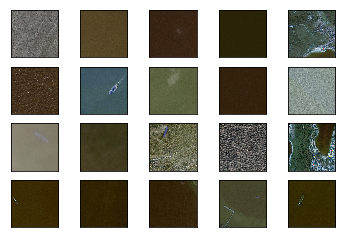

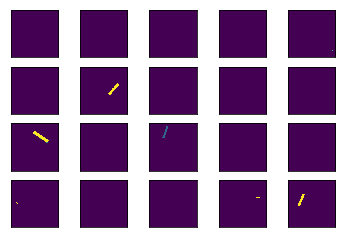

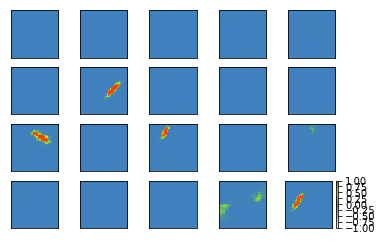

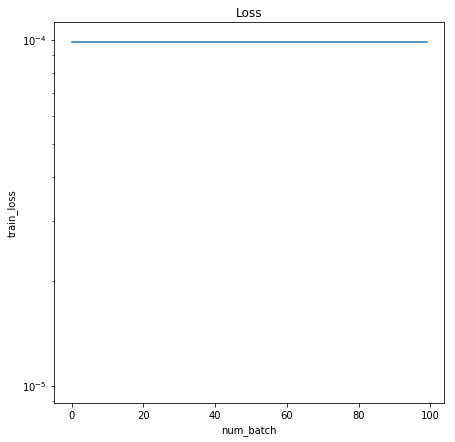

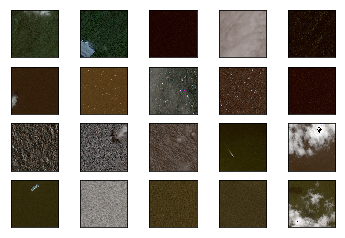

...

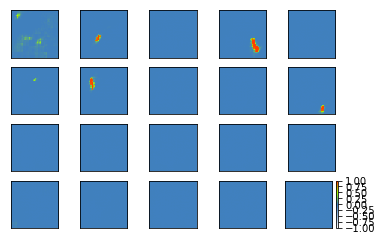

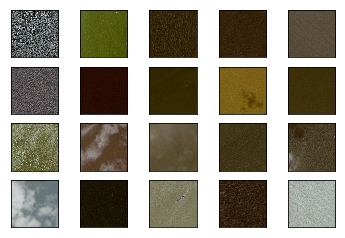

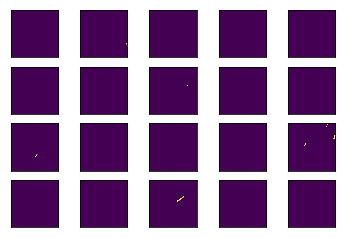

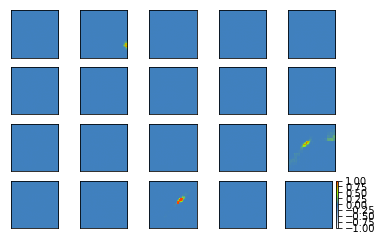

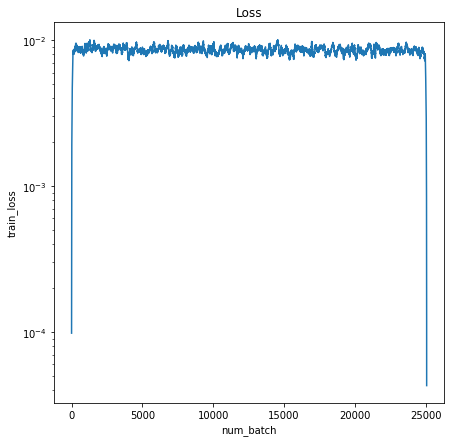

In [29]:
m = make_model() 
m = m.cuda(0)
train(15, 1.6e-6, "./photo/1004-img-aug-kai", st_epoch=5 ,model_path="u_net_4_2400.pkl")

In [8]:
import matplotlib.colors as clr
from mpl_toolkits.axes_grid1 import make_axes_locatable
cdict3 = {'red':((0.0,1.0,1.0),
                 (0.5,0.25,0.25),
                 (1.0,1.0,1.0)),
          'green':((0.0,1.0,1.0),
                   (0.5,0.5,0.5),
                   (0.75,1.0,1.0),
                   (1.0,0.25,0.25)),
          'blue':((0.0,1.0,1.0),
                  (0.5,0.75,0.75),
                  (0.75,0.0,0.0),
                  (1.0,0.0,0.0))}
cmap = clr.LinearSegmentedColormap('cmap', cdict3)


In [16]:
def test(submit_folder, model_path, submit_name): # model_pathは相対パスでフルのものを使う
    test_df = pd.read_csv("../input/sample_submission_v2.csv")  
    test_batch = make_loader(test_df, batch_size=BATCH_SIZE*2,shuffle=False,\
                           transform=None,mode='test')  
    submission = test_df.set_index('ImageId')  
    m = make_model(drop=0.0) 
    m = m.cuda(0) 
    m.load_state_dict(torch.load(model_path))
    for param in m.parameters():
            param.requires_grad = False  
    if not submit_folder in os.listdir("./submission"):
        os.mkdir(os.path.join("./submission", submit_folder))
    
    for _, (images, names) in enumerate(test_batch):
        x = Variable(images.float()).cuda(0)
        y = m.forward(x).reshape(-1, img_size, img_size).cuda(0) 
        preds = y.cpu().data  
        preds = np.where(y>=0.3, 1, 0)  
        preds = preds.astype(np.uint8)
        for i in range(len(names)):
            name = names[i] 
            pred = preds[i]   
            
            pred = pred.reshape((pred.shape[0],pred.shape[1], 1))  
            pred = cv2.resize(pred,(768,768))  
            submission.loc[name, "EncodedPixels"] =  rle_encode(pred)
        if _% 10 == 0:
            print("{} images converted".format(BATCH_SIZE*_*2))  
            submission.to_csv(os.path.join("./submission", os.path.join(submit_folder, submit_name)))
            if x.cpu().data.shape[0] > 20: 
                    
                plt.figure() 
                plt.title('original')
                for img_num in range(20):
                    plt.subplot(4,5,img_num+1)
                    plt.imshow(np.array(x.cpu().data[img_num]*256,dtype=np.uint8).transpose())
                    plt.tick_params(labelbottom='off',bottom='off')
                    plt.tick_params(labelleft='off', left='off')
                plt.show()

                plt.figure()
                plt.title('generated')
                for img_num in range(20):
                    plt.subplot(4,5,img_num+1)
                    a = np.array(y.cpu().data[img_num]).reshape(256,256)
                    ax = plt.gca()
                    im = ax.imshow(a, cmap=cmap,vmin=-1,vmax=1) 

                    plt.tick_params(labelbottom='off',bottom='off')
                    plt.tick_params(labelleft='off', left='off')
                divider = make_axes_locatable(ax)
                cax = divider.append_axes("right", size="5%", pad=0.05)
                plt.colorbar(im, cax=cax)
                plt.show() 

    submission.to_csv(os.path.join("./submission", os.path.join(submit_folder, submit_name)))  
    print("Completed!")
        
            
        
                 
    
    
    
    

Unet34(
  (rn): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu):

0 images converted


C:\Users\sunhe\AppData\Local\Programs\Python\Python36\lib\site-packages\matplotlib\cbook\deprecation.py:107: MatplotlibDeprecationWarning: Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


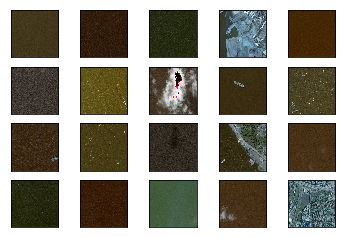

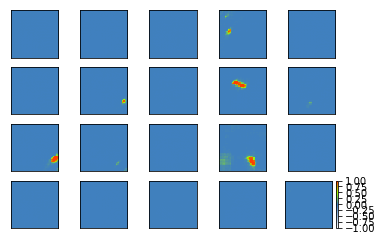

400 images converted


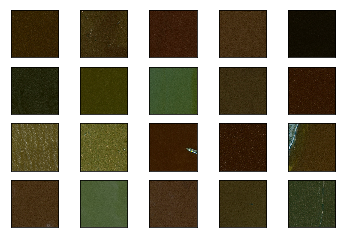

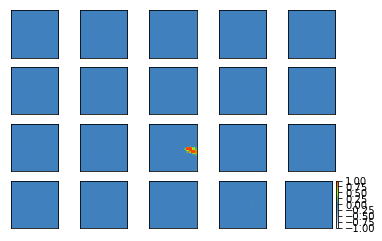

800 images converted


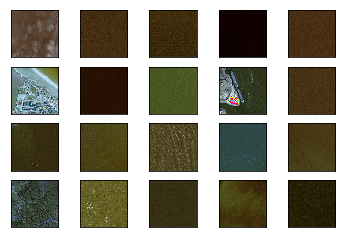

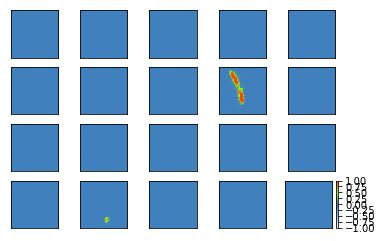

1200 images converted


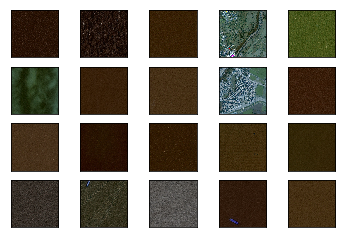

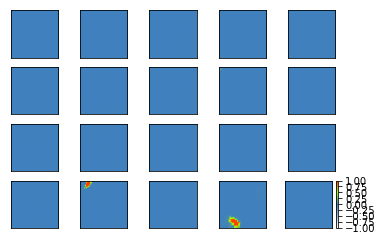

1600 images converted


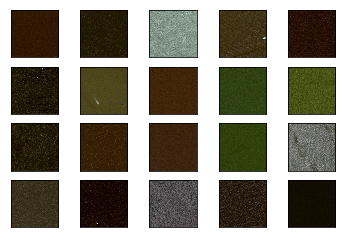

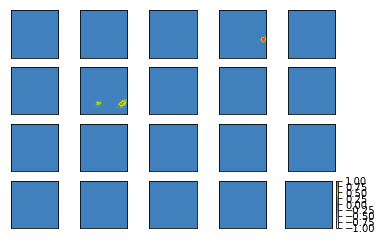

2000 images converted


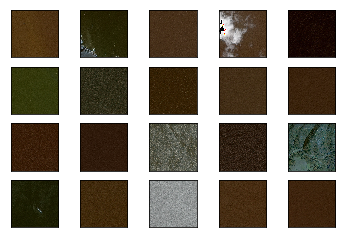

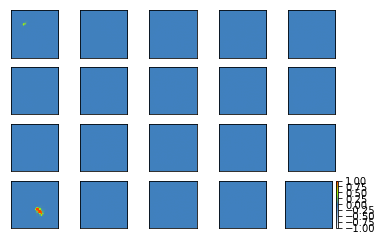

2400 images converted


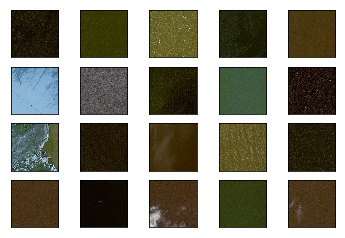

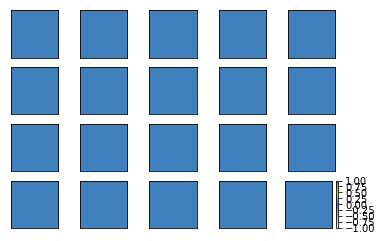

2800 images converted


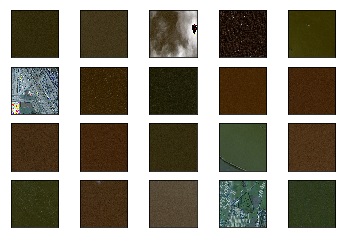

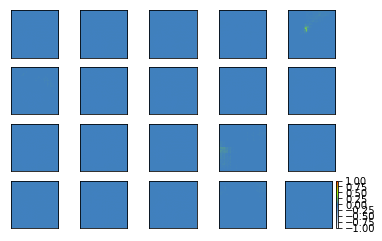

3200 images converted


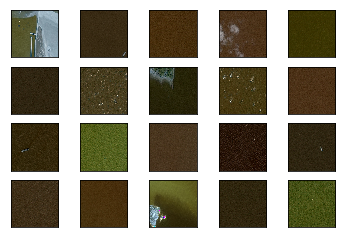

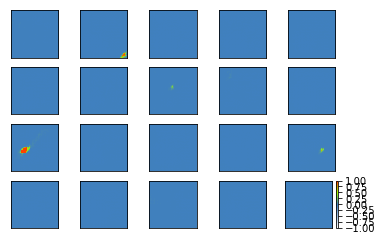

3600 images converted


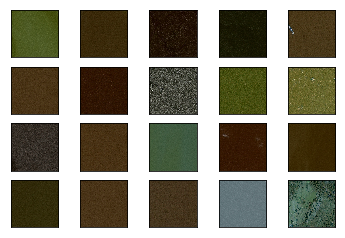

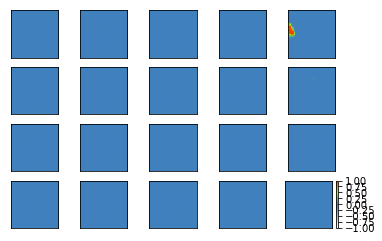

4000 images converted


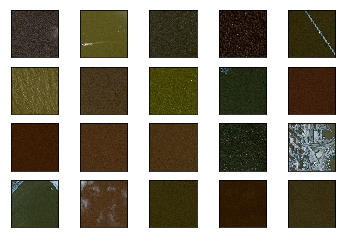

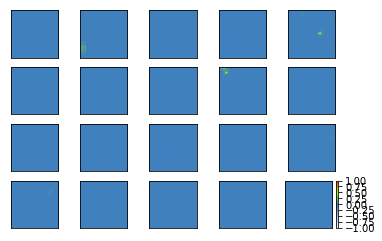

4400 images converted


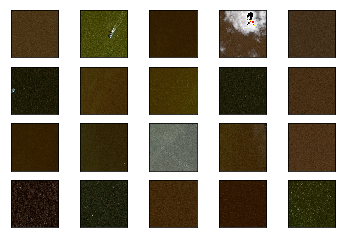

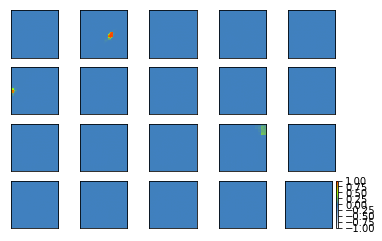

4800 images converted


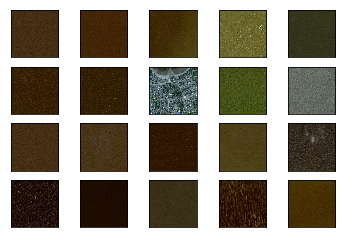

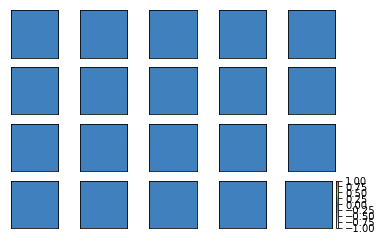

5200 images converted


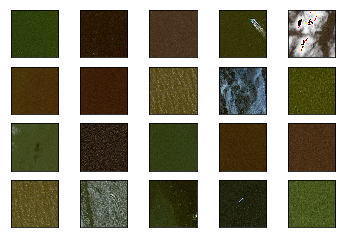

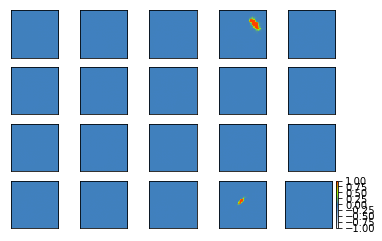

5600 images converted


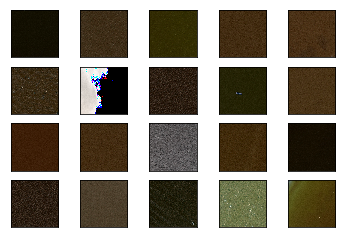

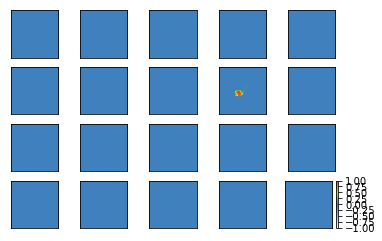

6000 images converted


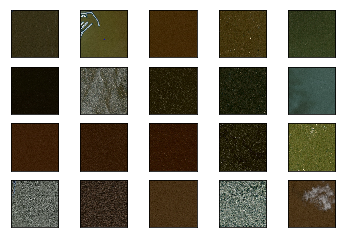

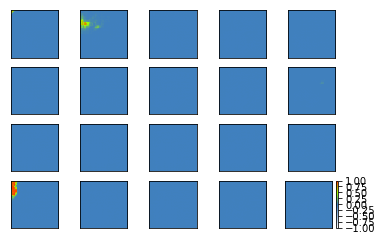

6400 images converted


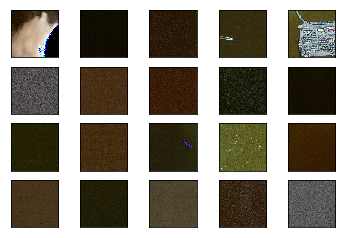

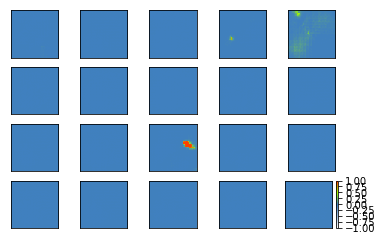

6800 images converted


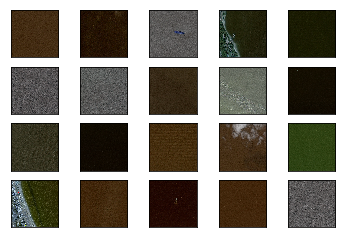

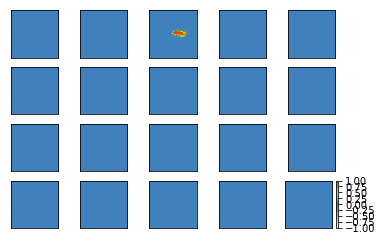

In [ ]:
test(submit_folder="submission_1015_14", model_path="./photo/1004-img-aug-kai/u_net_14_2400.pkl", 
                                                                      submit_name="submission_1015_14.csv")